In [149]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
default_of_credit_card_clients = fetch_ucirepo(id=350) 
  
# data (as pandas dataframes) 
X = default_of_credit_card_clients.data.features 
y = default_of_credit_card_clients.data.targets 

In [150]:
''' X1: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.\r\n
X2: Gender (1 = male; 2 = female).\r\n
X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).\r\n
X4: Marital status (1 = married; 2 = single; 3 = others).\r\n
X5: Age (year).\r\n
X6 - X11: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows: 
X6 = the repayment status in September, 2005; X7 = the repayment status in August, 2005; . . .;
X11 = the repayment status in April, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.\r\n
X12-X17: Amount of bill statement (NT dollar). 
X12 = amount of bill statement in September, 2005; 
X13 = amount of bill statement in August, 2005; . . .; 
X17 = amount of bill statement in April, 2005. \r\n
X18-X23: Amount of previous payment (NT dollar). 
X18 = amount paid in September, 2005; 
X19 = amount paid in August, 2005; . . .;
X23 = amount paid in April, 2005.\r\n', 'citation': None}}
Y
'''

" X1: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.\r\n\nX2: Gender (1 = male; 2 = female).\r\n\nX3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).\r\n\nX4: Marital status (1 = married; 2 = single; 3 = others).\r\n\nX5: Age (year).\r\n\nX6 - X11: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows: \nX6 = the repayment status in September, 2005; X7 = the repayment status in August, 2005; . . .;\nX11 = the repayment status in April, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.\r\n\nX12-X17: Amount of bill statement (NT dollar). \nX12 = amount of bill statement in September, 2005; \nX13 = amount of bill statement in August, 2005; . . .;

In [151]:
# Let's create some new useful features from the existing ones
# Such as clustering
# number of months paid overall
# sum of bill statement vs median sum of bill statement across all months
# debt to income ration
# average payment delay
# payment consistency
# credit utilization


X['Payment_Consistency'] = X[['X6', 'X7', 'X8', 'X9', 'X10', 'X11']].std(axis=1)
X['Total_Bill_Amount'] = X[['X12', 'X13', 'X14', 'X15', 'X16', 'X17']].sum(axis=1)
X['Credit_Utilization_Ratio'] = X['Total_Bill_Amount'] / X['X1']
X['Total_Payment_Amount'] = X[['X18', 'X19', 'X20', 'X21', 'X22', 'X23']].sum(axis=1)
median_payment_amount = X['Total_Payment_Amount'].median()
X['Debt_to_Income_Ratio'] = X['X1'] / (X['Total_Payment_Amount'] + 1)  # Adding 1 to avoid division by zero
X['Total_Delays'] = (X[['X6', 'X7', 'X8', 'X9', 'X10', 'X11']] > 0).sum(axis=1)
X['Total_Payments_Done'] = (X[['X18', 'X19', 'X20', 'X21', 'X22', 'X23']] > 0).sum(axis=1)
X['On_Time_Payments'] = (X[['X6', 'X7', 'X8', 'X9', 'X10', 'X11']] == -1).sum(axis=1)
X['Payment_amount_to_median'] = X['Total_Payment_Amount'] / median_payment_amount


# Finally drop unnecessary column
X.drop(columns = ['Total_Payment_Amount', 'Total_Bill_Amount'], inplace = True)


C:\Users\kaczm\AppData\Local\Temp\ipykernel_7500\3226967362.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



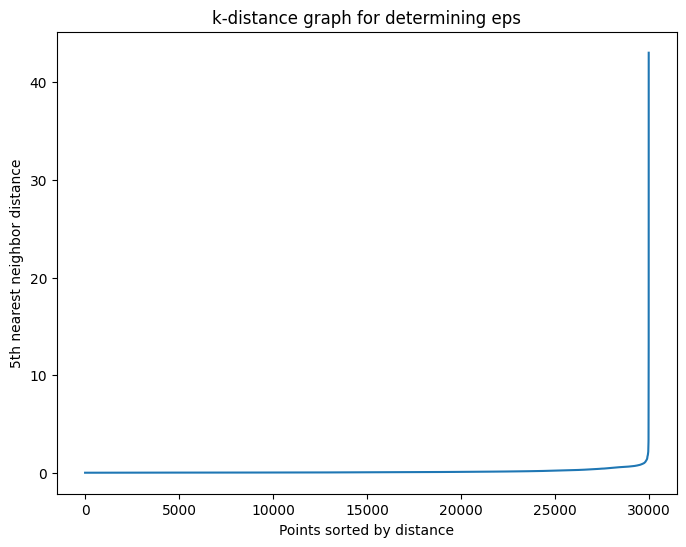

In [152]:
# Now I will do clustering based on the features I engineered and I'm thinking of using DBSCAN but first we need to search for n appropriate min distance

from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Step 1: Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X[['Payment_Consistency', 'Credit_Utilization_Ratio', 
                                   'Debt_to_Income_Ratio', 'Total_Delays', 'Total_Payments_Done', 
                                   'On_Time_Payments', 'Payment_amount_to_median']])

# Step 2: Fit the NearestNeighbors model
neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X_scaled)
distances, indices = nbrs.kneighbors(X_scaled)

# Step 3: Sort the distances (5th nearest neighbor distance for each point)
distances = np.sort(distances[:, 4], axis=0)

# Step 4: Plot the k-distance graph
plt.figure(figsize=(8, 6))
plt.plot(distances)
plt.xlabel('Points sorted by distance')
plt.ylabel('5th nearest neighbor distance')
plt.title('k-distance graph for determining eps')
plt.show()


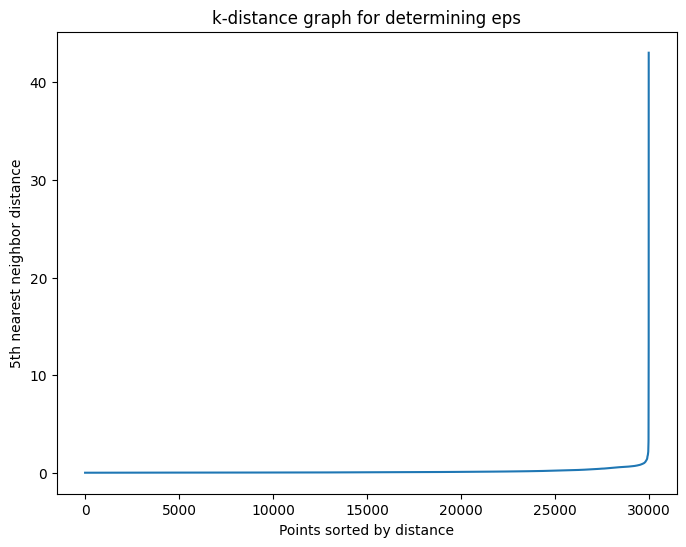

The value of eps at the greatest slope (elbow point) is approximately: 1.7513395916548866


In [153]:
# Ok so the balue seems to be around 0.5 but let's check based on the derivative

from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np
from kneed import KneeLocator




# fit the NearestNeighbors model
neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X_scaled)
distances, indices = nbrs.kneighbors(X_scaled)

# now let's ort the distances (5th nearest neighbor distance for each point)
distances = np.sort(distances[:, 4], axis=0)

# plot
plt.figure(figsize=(8, 6))
plt.plot(distances)
plt.xlabel('Points sorted by distance')
plt.ylabel('5th nearest neighbor distance')
plt.title('k-distance graph for determining eps')
plt.show()

# and use KneeLocator to find the elbow point
kneedle = KneeLocator(range(len(distances)), distances, S=1.0, curve="convex", direction="increasing")
eps_value = distances[kneedle.elbow]

print(f'The value of eps at the greatest slope (elbow point) is approximately: {eps_value}')


In [154]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# now apply DBSCAN
dbscan = DBSCAN(eps=1.76, min_samples=18)  
dbscan.fit(X_scaled)

X['Cluster'] = dbscan.labels_

# Display the resulting DataFrame with cluster labels
print(X[['Payment_Consistency', 'Credit_Utilization_Ratio', 
         'Debt_to_Income_Ratio', 'Total_Delays', 'Total_Payments_Done', 
         'On_Time_Payments', 'Payment_amount_to_median', 'Cluster']])

# Check the number of clusters and noise points
n_clusters = len(set(dbscan.labels_)) - (1 if -1 in dbscan.labels_ else 0)
n_noise = list(dbscan.labels_).count(-1)
print(f'Number of clusters: {n_clusters}')
print(f'Number of noise points: {n_noise}')

# We got 2 clusters 

       Payment_Consistency  Credit_Utilization_Ratio  Debt_to_Income_Ratio  \
0                 1.861899                  0.385200             28.985507   
1                 1.224745                  0.142308             23.995201   
2                 0.000000                  1.129478              8.167710   
3                 0.000000                  4.626680              5.960186   
4                 0.516398                  2.186780              0.846740   
...                    ...                       ...                   ...   
29995             0.000000                  3.297041              5.170266   
29996             0.516398                  0.141213             10.351253   
29997             1.966384                  2.349867              0.958436   
29998             0.752773                  3.332638              0.543545   
29999             0.000000                  4.617480              6.017571   

       Total_Delays  Total_Payments_Done  On_Time_Payments  \
0

In [155]:
X['Cluster'].value_counts()

# The Clusters are havily imbalanced so I'll try kmeans as well

Cluster
 0    29931
-1       48
 1       21
Name: count, dtype: int64

In [156]:
# Let's visualize on a few sets of features

import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

features = ['Payment_Consistency', 'Credit_Utilization_Ratio', 
         'Debt_to_Income_Ratio', 'Total_Delays', 'Total_Payments_Done', 
         'On_Time_Payments', 'Payment_amount_to_median', 'Cluster']

X_scaled_df = pd.DataFrame(X_scaled, columns=features[:-1])
X_scaled_df['Cluster'] = dbscan.labels_


feature_pairs = [
    ('Payment_Consistency', 'Credit_Utilization_Ratio'),
    ('Debt_to_Income_Ratio', 'Total_Delays'),
    ('Total_Payments_Done', 'On_Time_Payments'),
    ('Payment_Consistency', 'Debt_to_Income_Ratio'),
    ('Credit_Utilization_Ratio', 'Total_Delays'),
    ('Payment_amount_to_median', 'Total_Payments_Done')
]

fig = make_subplots(rows=2, cols=3, subplot_titles=[f'{f1} vs {f2}' for f1, f2 in feature_pairs])

for i, (feature1, feature2) in enumerate(feature_pairs):
    row = i // 3 + 1
    col = i % 3 + 1
    scatter = px.scatter(X_scaled_df, x=feature1, y=feature2, color='Cluster', 
                         color_continuous_scale='Viridis').data[0]
    fig.add_trace(scatter, row=row, col=col)

# Update layout
fig.update_layout(height=800, width=1200, title_text='DBSCAN Clustering Facet Plot')

fig.show()

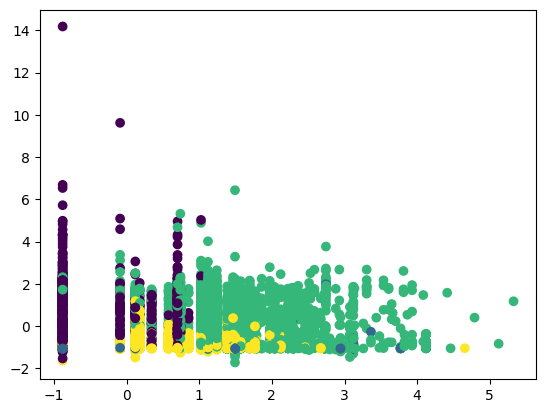

In [157]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=4, random_state=42)

kmeans.fit(X_scaled)

plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=kmeans.labels_, cmap='viridis')

labels = kmeans.labels_

X['Cluster_kmeans'] = labels

# Let's drop DBSCAN clusters 

X.drop(columns = ['Cluster'], inplace = True)

In [158]:
# We are gonna have to keep the noise points since real life data will often involve noise and we want our model to be more robus
# So the next step is to normalize the data

# X1, X12-X17, X18-X23

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_normalized = X.copy()
X_normalized[['X1', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'X19', 'X20', 'X21', 'X22', 'X23']] = scaler.fit_transform(X_normalized[['X1', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'X19', 'X20', 'X21', 'X22', 'X23']])


In [159]:
# Now do the same with Debt_to_Income_Ratio and Payment_amount_to_median

X_normalized[['Debt_to_Income_Ratio', 'Payment_amount_to_median']] = scaler.fit_transform(X_normalized[['Debt_to_Income_Ratio', 'Payment_amount_to_median']])


In [ ]:

# Save the data to the project folder

X_normalized.to_csv('C:/Users/kaczm/Desktop/Credit Card Risk/default_of_credit_card_clients.csv', index=False)

y.to_csv('C:/Users/kaczm/Desktop/Credit Card Risk/default_of_credit_card_target.csv', index=False)